# Introdução ao Processamento de Dados LiDAR (LAS/LAZ)

Este notebook demonstra operações básicas para trabalhar com dados LiDAR armazenados em arquivos LAS/LAZ. Vamos explorar:

1. O que são dados LiDAR
2. Leitura de arquivos LAS/LAZ
3. Visualização básica de nuvens de pontos
4. Análise de atributos dos pontos
5. Operações de filtragem e processamento
6. Exportação e salvamento de resultados

In [1]:
# Importando bibliotecas
import os
import numpy as np
import matplotlib.pyplot as plt
import laspy
import open3d as o3d
import plotly.graph_objects as go
from pyntcloud import PyntCloud
import pandas as pd
from IPython.display import display
import ipywidgets as widgets

# Configurações para visualização
%matplotlib inline
plt.rcParams['figure.figsize'] = [12, 8]

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


## 2. Leitura de Arquivos LAS/LAZ

Vamos começar listando os arquivos LAS/LAZ disponíveis na pasta de dados e lendo um arquivo.

In [2]:
# Listar arquivos LAS/LAZ na pasta data
data_dir = "data"
las_files = [f for f in os.listdir(data_dir) if f.endswith((
                                                            '.las', 
                                                            # '.laz' # Arquivo já descompactado
                                                            ))]

print(f"Arquivos LAS/LAZ encontrados: {len(las_files)}")
for idx, file in enumerate(las_files):
    print(f"{idx+1}. {file}")

Arquivos LAS/LAZ encontrados: 3
1. USGS_LPC_NE_Statewide_D23_13T_FG_7085.las
2. USGS_LPC_NE_Statewide_D23_13T_GH_2362.las
3. USGS_LPC_NE_Statewide_D23_13T_GH_3843.las


In [3]:
# Função para permitir a seleção de um arquivo
def select_file(change):
    global selected_file_path
    selected_file_path = os.path.join(data_dir, change['new'])
    print(f"Arquivo selecionado: {selected_file_path}")

# Widget para seleção do arquivo
file_dropdown = widgets.Dropdown(
    options=las_files,
    description='Selecione o arquivo:',
    style={'description_width': 'initial'}
)

file_dropdown.observe(select_file, names='value')
selected_file_path = os.path.join(data_dir, las_files[0]) if las_files else None
display(file_dropdown)

Dropdown(description='Selecione o arquivo:', options=('USGS_LPC_NE_Statewide_D23_13T_FG_7085.las', 'USGS_LPC_N…

In [4]:
# Leitura do arquivo LAS/LAZ selecionado usando laspy
def read_las_file(file_path):
    try:
        las_data = laspy.read(file_path)
        print("\nArquivo carregado com sucesso!")
        return las_data
    except Exception as e:
        print(f"Erro ao carregar o arquivo: {e}")
        return None

# Carregar o arquivo selecionado
if selected_file_path:
    las_data = read_las_file(selected_file_path)
else:
    print("Nenhum arquivo LAS/LAZ encontrado na pasta 'data'")


Arquivo carregado com sucesso!


In [5]:
# Exibir informações básicas sobre o arquivo
if 'las_data' in locals() and las_data is not None:
    print(f"Versão do formato LAS: {las_data.header.version}")
    print(f"Número total de pontos: {las_data.header.point_count}")
    print(f"Extensão dos dados:")
    print(f"  X: {las_data.header.mins[0]:.2f} a {las_data.header.maxs[0]:.2f}")
    print(f"  Y: {las_data.header.mins[1]:.2f} a {las_data.header.maxs[1]:.2f}")
    print(f"  Z: {las_data.header.mins[2]:.2f} a {las_data.header.maxs[2]:.2f}")
    
    # Mostrar as dimensões disponíveis (atributos) nos dados
    print("\nAtributos disponíveis:")
    for dimension in las_data.point_format.dimensions:
        print(f"  - {dimension.name}")

Versão do formato LAS: 1.4
Número total de pontos: 24636066
Extensão dos dados:
  X: 670000.00 a 671000.00
  Y: 4685000.00 a 4686000.00
  Z: 1174.95 a 1310.85

Atributos disponíveis:
  - X
  - Y
  - Z
  - intensity
  - return_number
  - number_of_returns
  - synthetic
  - key_point
  - withheld
  - overlap
  - scanner_channel
  - scan_direction_flag
  - edge_of_flight_line
  - classification
  - user_data
  - scan_angle
  - point_source_id
  - gps_time


## 3. Visualização Básica da Nuvem de Pontos

Vamos criar diferentes visualizações para explorar os dados LiDAR.

In [6]:
# Função para extrair coordenadas e criar array de pontos
def get_points(las_data, max_points=None):
    # Extrair coordenadas
    x = las_data.x
    y = las_data.y
    z = las_data.z
    
    # Limitar o número de pontos para visualização mais rápida (se necessário)
    if max_points and max_points < len(x):
        idx = np.random.choice(len(x), max_points, replace=False)
        x = x[idx]
        y = y[idx]
        z = z[idx]
    
    return np.vstack((x, y, z)).transpose()

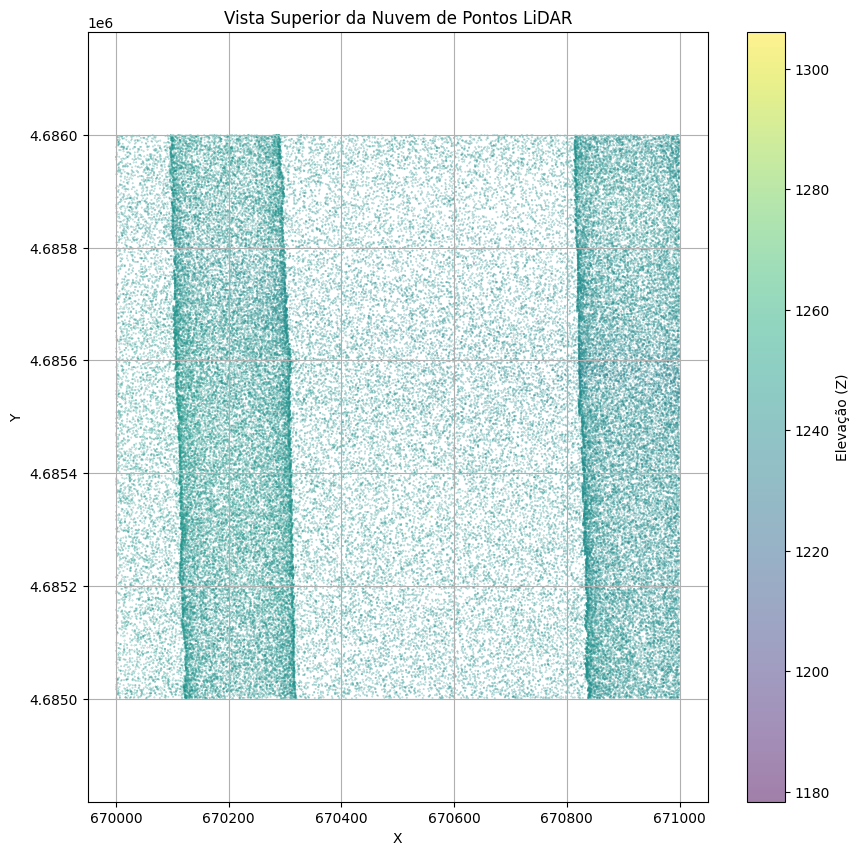

In [7]:
# Visualização 2D simples: vista superior da nuvem de pontos
if 'las_data' in locals() and las_data is not None:
    plt.figure(figsize=(10, 10))
    # Amostragem para tornar a visualização mais rápida
    sample_idx = np.random.choice(len(las_data.x), min(100000, len(las_data.x)), replace=False)
    
    plt.scatter(las_data.x[sample_idx], las_data.y[sample_idx], 
                c=las_data.z[sample_idx], cmap='viridis', s=0.1, alpha=0.5)
    plt.colorbar(label='Elevação (Z)')
    plt.title('Vista Superior da Nuvem de Pontos LiDAR')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.axis('equal')
    plt.grid(True)
    plt.show()

In [8]:
# Visualização 3D interativa usando Plotly
if 'las_data' in locals() and las_data is not None:
    # Amostragem para tornar a visualização mais rápida
    sample_size = min(200000, len(las_data.x))
    sample_idx = np.random.choice(len(las_data.x), sample_size, replace=False)
    
    # Criar figura 3D
    fig = go.Figure(data=[go.Scatter3d(
        x=las_data.x[sample_idx],
        y=las_data.y[sample_idx],
        z=las_data.z[sample_idx],
        mode='markers',
        marker=dict(
            size=1,
            color=las_data.z[sample_idx],
            colorscale='Viridis',
            opacity=0.8,
            colorbar=dict(title="Elevação (Z)")
        )
    )])
    
    fig.update_layout(
        title="Visualização 3D da Nuvem de Pontos LiDAR",
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z',
            aspectmode='data'
        ),
        width=900,
        height=700,
    )
    
    fig.show()

In [15]:
# Visualização usando Open3D (ótimo para interação com a nuvem de pontos)
if 'las_data' in locals() and las_data is not None:
    # Obter pontos (com limite para melhor desempenho)
    points = get_points(las_data, max_points=500000)
    
    # Criar nuvem de pontos Open3D
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(points)
    
    # Normalizar alturas para coloração
    heights = points[:, 2]  # valores Z
    colors = plt.cm.viridis((heights - np.min(heights)) / (np.max(heights) - np.min(heights)))[:, :3]
    pcd.colors = o3d.utility.Vector3dVector(colors)
    
    # Visualizar (esta função abre uma janela separada para visualização interativa)
    print("\nAbrindo visualizador Open3D (janela separada)...")
    print("Dicas de navegação:")
    print("- Rotação: clique e arraste com o botão esquerdo do mouse")
    print("- Zoom: roda do mouse ou botão direito + arrastar")
    print("- Movimento: Shift + clique e arraste")
    o3d.visualization.draw_geometries([pcd])


Abrindo visualizador Open3D (janela separada)...
Dicas de navegação:
- Rotação: clique e arraste com o botão esquerdo do mouse
- Zoom: roda do mouse ou botão direito + arrastar
- Movimento: Shift + clique e arraste


## 4. Análise de Atributos dos Pontos

Vamos explorar os diferentes atributos disponíveis nos dados LiDAR.

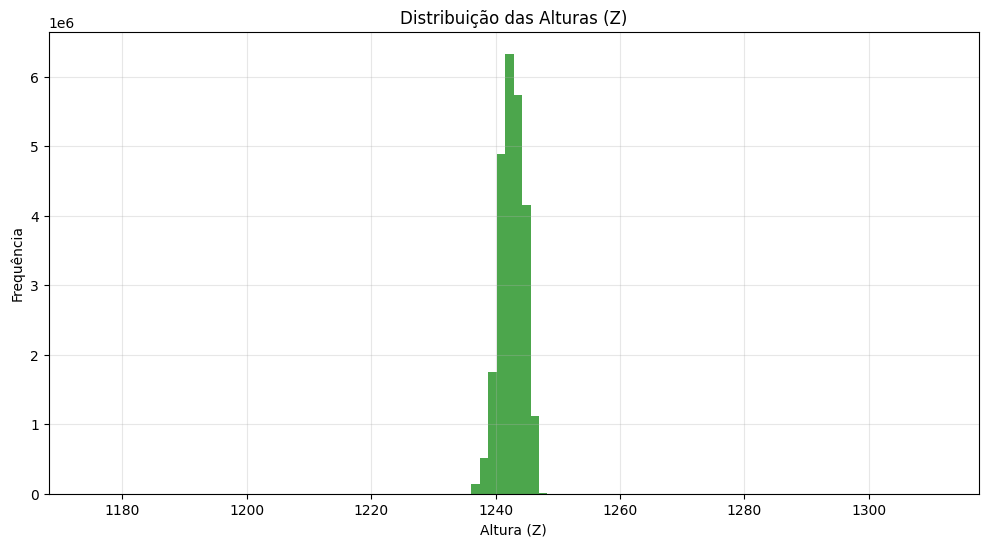

Estatísticas de altura (Z):
  Mínimo: 1174.95
  Máximo: 1310.85
  Média: 1242.59
  Mediana: 1242.58
  Desvio padrão: 1.97


In [9]:
# Análise da distribuição de alturas (Z)
if 'las_data' in locals() and las_data is not None:
    plt.figure(figsize=(12, 6))
    plt.hist(las_data.z, bins=100, alpha=0.7, color='green')
    plt.title('Distribuição das Alturas (Z)')
    plt.xlabel('Altura (Z)')
    plt.ylabel('Frequência')
    plt.grid(True, alpha=0.3)
    plt.show()
    
    # Estatísticas básicas
    print(f"Estatísticas de altura (Z):")
    print(f"  Mínimo: {np.min(las_data.z):.2f}")
    print(f"  Máximo: {np.max(las_data.z):.2f}")
    print(f"  Média: {np.mean(las_data.z):.2f}")
    print(f"  Mediana: {np.median(las_data.z):.2f}")
    print(f"  Desvio padrão: {np.std(las_data.z):.2f}")

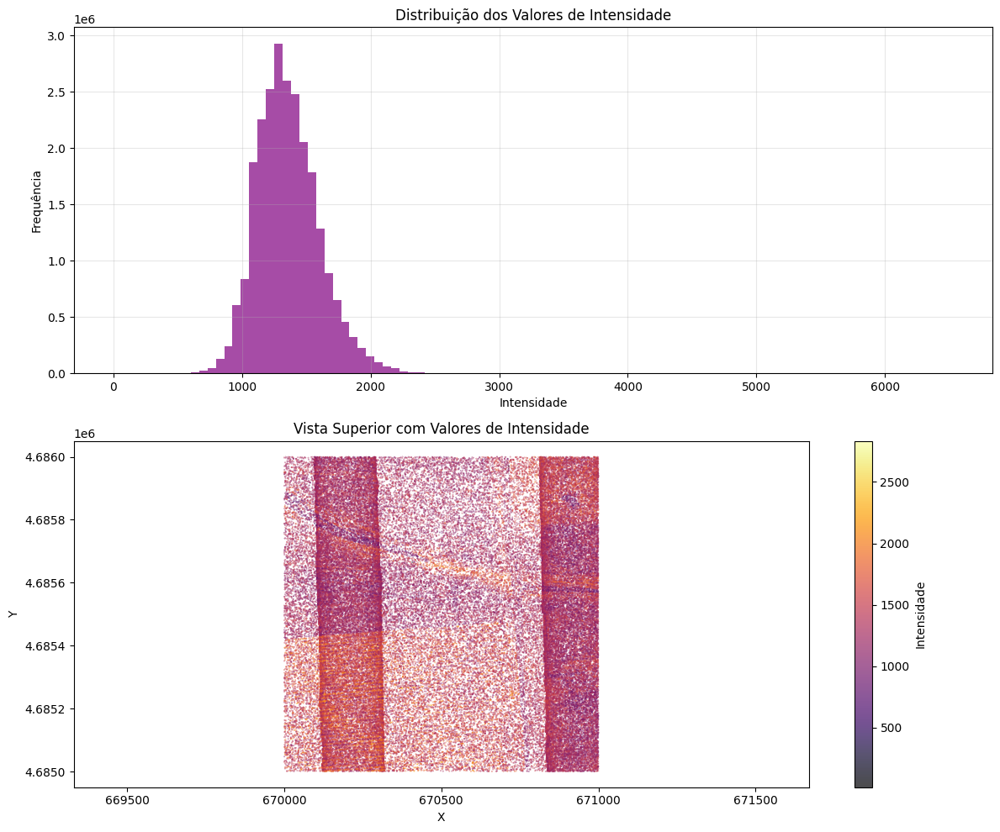

In [10]:
# Análise da intensidade (se disponível)
if 'las_data' in locals() and las_data is not None and hasattr(las_data, 'intensity'):
    plt.figure(figsize=(12, 10))
    
    # Subplot 1: Histograma de intensidade
    plt.subplot(2, 1, 1)
    plt.hist(las_data.intensity, bins=100, alpha=0.7, color='purple')
    plt.title('Distribuição dos Valores de Intensidade')
    plt.xlabel('Intensidade')
    plt.ylabel('Frequência')
    plt.grid(True, alpha=0.3)
    
    # Subplot 2: Visualização da intensidade na nuvem de pontos
    plt.subplot(2, 1, 2)
    sample_idx = np.random.choice(len(las_data.x), min(100000, len(las_data.x)), replace=False)
    plt.scatter(las_data.x[sample_idx], las_data.y[sample_idx], 
                c=las_data.intensity[sample_idx], cmap='inferno', s=0.1, alpha=0.7)
    plt.colorbar(label='Intensidade')
    plt.title('Vista Superior com Valores de Intensidade')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

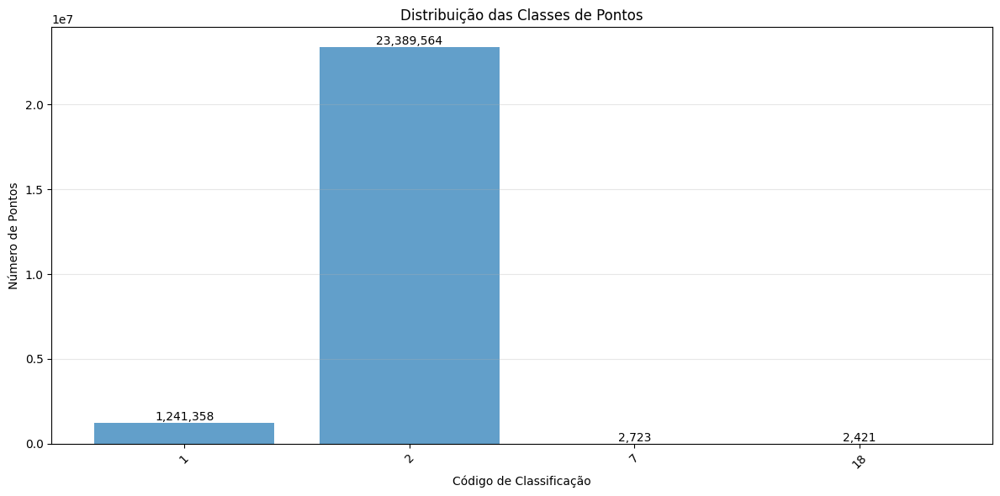


Classes identificadas no conjunto de dados:
  Classe 1 - Não classificado: 1,241,358 pontos (5.04%)
  Classe 2 - Solo: 23,389,564 pontos (94.94%)
  Classe 7 - Ponto baixo (ruído): 2,723 pontos (0.01%)
  Classe 18 - Ruído alto: 2,421 pontos (0.01%)


In [11]:
# Análise da classificação
if 'las_data' in locals() and las_data is not None and hasattr(las_data, 'classification'):
    # Definição das classes padrão LAS
    class_names = {
        0: "Criado, nunca classificado",
        1: "Não classificado",
        2: "Solo",
        3: "Vegetação baixa",
        4: "Vegetação média",
        5: "Vegetação alta",
        6: "Edificação",
        7: "Ponto baixo (ruído)",
        8: "Ponto-chave",
        9: "Água",
        10: "Trilho ferrovia",
        11: "Superfície de rodovia",
        12: "Ponto sobreposto",
        13: "Fio - proteção",
        14: "Fio - condutor (fase)",
        15: "Torre de transmissão",
        16: "Conector de fio",
        17: "Cobertura da ponte",
        18: "Ruído alto"
    }
    
    # Contagem de pontos por classe
    unique_classes, counts = np.unique(las_data.classification, return_counts=True)
    class_counts = dict(zip(unique_classes, counts))
    
    # Criar labels para o gráfico
    labels = [f"{c} - {class_names.get(c, 'Desconhecido')} ({class_counts[c]})" for c in unique_classes]
    
    # Plotar distribuição de classes
    plt.figure(figsize=(12, 6))
    bars = plt.bar(range(len(unique_classes)), counts, alpha=0.7)
    plt.xticks(range(len(unique_classes)), [str(c) for c in unique_classes], rotation=45)
    plt.title('Distribuição das Classes de Pontos')
    plt.xlabel('Código de Classificação')
    plt.ylabel('Número de Pontos')
    plt.grid(True, alpha=0.3, axis='y')
    
    # Adicionar labels no topo das barras
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                 f'{height:,}', ha='center', va='bottom', rotation=0)
    
    plt.tight_layout()
    plt.show()
    
    # Mostrar descrição das classes encontradas
    print("\nClasses identificadas no conjunto de dados:")
    for c in unique_classes:
        percentage = (class_counts[c] / len(las_data.classification)) * 100
        print(f"  Classe {c} - {class_names.get(c, 'Desconhecido')}: {class_counts[c]:,} pontos ({percentage:.2f}%)")

## 5. Operações de Filtragem e Processamento

Vamos demonstrar algumas operações comuns de processamento de dados LiDAR.

Pontos de solo extraídos: 32,667,904 de 35,126,057 (93.00%)


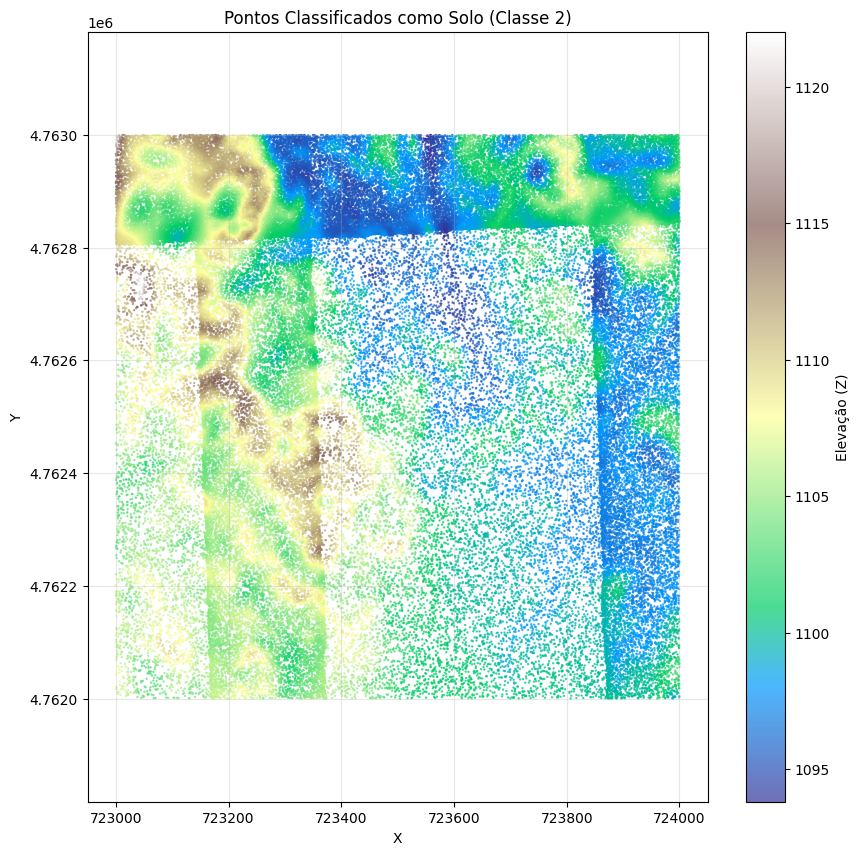

In [19]:
# Filtragem por classificação (exemplo: extrair apenas pontos de solo)
if 'las_data' in locals() and las_data is not None and hasattr(las_data, 'classification'):
    # Verificar se existem pontos de solo (classe 2)
    if 2 in np.unique(las_data.classification):
        # Filtrar pontos de solo
        ground_mask = las_data.classification == 2
        ground_points = {
            'x': las_data.x[ground_mask],
            'y': las_data.y[ground_mask],
            'z': las_data.z[ground_mask]
        }
        
        print(f"Pontos de solo extraídos: {len(ground_points['x']):,} de {len(las_data.x):,} ({len(ground_points['x'])/len(las_data.x)*100:.2f}%)")
        
        # Visualizar pontos de solo
        plt.figure(figsize=(10, 10))
        # Amostragem para visualização mais rápida
        sample_size = min(100000, len(ground_points['x']))
        sample_idx = np.random.choice(len(ground_points['x']), sample_size, replace=False)
        
        plt.scatter(ground_points['x'][sample_idx], ground_points['y'][sample_idx], 
                    c=ground_points['z'][sample_idx], cmap='terrain', s=0.5, alpha=0.7)
        plt.colorbar(label='Elevação (Z)')
        plt.title('Pontos Classificados como Solo (Classe 2)')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.axis('equal')
        plt.grid(True, alpha=0.3)
        plt.show()
    else:
        print("Não foram encontrados pontos classificados como solo (classe 2) no arquivo.")

In [ ]:
# Criação de um modelo digital de terreno (MDT) simples
if 'las_data' in locals() and las_data is not None:
    # Usar pontos de solo se disponíveis, caso contrário usar todos os pontos
    if hasattr(las_data, 'classification') and 2 in np.unique(las_data.classification):
        mask = las_data.classification == 2
        x = las_data.x[mask]
        y = las_data.y[mask]
        z = las_data.z[mask]
        print("Criando MDT a partir dos pontos classificados como solo.")
    else:
        x = las_data.x
        y = las_data.y
        z = las_data.z
        print("Criando MDT a partir de todos os pontos (sem filtragem por classe).")
    
    # Definir a resolução da grade
    resolution = 1.0  # metros
    
    # Calcular os limites da grade
    x_min, x_max = np.min(x), np.max(x)
    y_min, y_max = np.min(y), np.max(y)
    
    # Criar grade
    x_grid = np.arange(x_min, x_max, resolution)
    y_grid = np.arange(y_min, y_max, resolution)
    xx, yy = np.meshgrid(x_grid, y_grid)
    
    # Inicializar grade de elevação com NaN
    elevation_grid = np.full(xx.shape, np.nan)
    
    # Preencher grade - abordagem simplificada usando bins 2D
    x_bins = np.searchsorted(x_grid, x) - 1
    y_bins = np.searchsorted(y_grid, y) - 1
    
    # Filtrar índices fora dos limites
    valid_idx = (x_bins >= 0) & (y_bins >= 0) & (x_bins < len(x_grid)) & (y_bins < len(y_grid))
    x_bins = x_bins[valid_idx]
    y_bins = y_bins[valid_idx]
    z_vals = z[valid_idx]
    
    # Para cada célula da grade, encontrar o ponto com menor Z (simplificação do MDT)
    for i in range(len(x_grid)):
        for j in range(len(y_grid)):
            cell_points = (x_bins == i) & (y_bins == j)
            if np.any(cell_points):
                elevation_grid[j, i] = np.min(z_vals[cell_points])  # Use mínimo para MDT
    
    # Visualizar MDT
    plt.figure(figsize=(12, 10))
    plt.imshow(elevation_grid, cmap='terrain', extent=[x_min, x_max, y_min, y_max], origin='lower')
    plt.colorbar(label='Elevação (m)')
    plt.title('Modelo Digital de Terreno (MDT) Simplificado')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.grid(False)
    plt.show()
    
    # Visualização 3D do MDT
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Mascarar valores NaN para visualização
    masked_elevation = np.ma.masked_invalid(elevation_grid)
    
    # Reduzir a resolução para visualização mais rápida
    stride = max(1, int(len(x_grid)/100))
    surf = ax.plot_surface(xx[::stride, ::stride], yy[::stride, ::stride], masked_elevation[::stride, ::stride], 
                          cmap='terrain', linewidth=0, antialiased=True, alpha=0.8)
    
    ax.set_title('Visualização 3D do MDT')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Elevação (m)')
    fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5, label='Elevação (m)')
    plt.tight_layout()
    plt.show()

Criando MDT a partir dos pontos classificados como solo.


In [ ]:
# Segmentação por faixas de altura (exemplo: vegetação)
if 'las_data' in locals() and las_data is not None:
    # Definir faixas de altura (relativa ao solo ou valores absolutos)
    if hasattr(las_data, 'classification') and 2 in np.unique(las_data.classification):
        # Se tivermos pontos de solo, podemos calcular alturas relativas
        # Esta é uma abordagem simplificada - em projetos reais, seria melhor usar um MDT interpolado
        ground_mask = las_data.classification == 2
        ground_z = np.mean(las_data.z[ground_mask])  # Média como simplificação
        relative_heights = las_data.z - ground_z
        print(f"Altura média do solo: {ground_z:.2f} m")
        height_description = "relativa ao solo"
    else:
        # Sem classificação de solo, usar valores absolutos
        relative_heights = las_data.z
        height_description = "absoluta"
    
    # Definir categorias de altura
    height_bins = [
        (-np.inf, 0.5, "Solo/Estruturas baixas"),
        (0.5, 2.0, "Vegetação baixa / Arbustos"),
        (2.0, 10.0, "Vegetação média / Árvores pequenas"),
        (10.0, np.inf, "Vegetação alta / Árvores grandes")
    ]
    
    # Criar máscaras para cada categoria
    masks = []
    for min_h, max_h, _ in height_bins:
        masks.append((relative_heights >= min_h) & (relative_heights < max_h))
    
    # Plotar cada categoria com cor diferente
    plt.figure(figsize=(12, 10))
    
    # Amostragem para visualização mais rápida
    sample_size = min(500000, len(las_data.x))
    sample_idx = np.random.choice(len(las_data.x), sample_size, replace=False)
    
    # Cores para cada categoria
    colors = ['brown', 'green', 'lime', 'darkgreen']
    
    # Plotar cada categoria
    for i, (mask, (_, _, label)) in enumerate(zip(masks, height_bins)):
        mask_sample = mask[sample_idx]
        if np.any(mask_sample):
            plt.scatter(las_data.x[sample_idx][mask_sample], las_data.y[sample_idx][mask_sample], 
                       c=colors[i], s=0.5, alpha=0.7, label=label)
    
    plt.title(f'Segmentação por Faixas de Altura ({height_description})')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.axis('equal')
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.show()
    
    # Mostrar estatísticas de cada categoria
    print("\nEstatísticas por categoria de altura:")
    for i, ((min_h, max_h, label), mask) in enumerate(zip(height_bins, masks)):
        count = np.sum(mask)
        percentage = (count / len(las_data.x)) * 100
        print(f"  {label} ({min_h if min_h != -np.inf else 'Mín'} a {max_h if max_h != np.inf else 'Máx'} m): {count:,} pontos ({percentage:.2f}%)")

## 6. Exportação e Salvamento de Resultados

Demonstração de como salvar subconjuntos ou dados processados.

In [ ]:
# Função para exportar um subconjunto de pontos para um novo arquivo LAS
def export_subset(las_data, output_path, mask=None, header_changes=None):
    try:
        # Criar uma cópia dos pontos
        if mask is None:
            # Exportar todos os pontos
            subset = las_data.copy()
        else:
            # Exportar apenas os pontos que correspondem à máscara
            subset = las_data.points[mask].copy()
        
        # Aplicar alterações ao cabeçalho, se houver
        if header_changes:
            for key, value in header_changes.items():
                if hasattr(subset.header, key):
                    setattr(subset.header, key, value)
        
        # Salvar o arquivo
        subset.write(output_path)
        print(f"Arquivo salvo com sucesso em: {output_path}")
        print(f"Total de pontos exportados: {subset.header.point_count:,}")
        return True
    except Exception as e:
        print(f"Erro ao exportar arquivo: {e}")
        return False

In [ ]:
# Exemplo: Exportar apenas pontos de solo (se disponíveis)
if 'las_data' in locals() and las_data is not None and hasattr(las_data, 'classification'):
    # Verificar se existem pontos de solo
    if 2 in np.unique(las_data.classification):
        ground_mask = las_data.classification == 2
        ground_count = np.sum(ground_mask)
        
        if ground_count > 0:
            output_dir = "processed_data"
            os.makedirs(output_dir, exist_ok=True)
            
            # Nome do arquivo de saída
            input_filename = os.path.basename(selected_file_path)
            output_filename = f"ground_only_{input_filename}"
            output_path = os.path.join(output_dir, output_filename)
            
            # Alterações no cabeçalho
            header_changes = {
                "generating_software": f"LiDAR Tutorial Notebook - Ground Filter"
            }
            
            # Exportar
            print(f"Exportando {ground_count:,} pontos de solo...")
            export_subset(las_data, output_path, ground_mask, header_changes)
        else:
            print("Não foram encontrados pontos de solo para exportar.")
    else:
        print("Não foram encontrados pontos classificados como solo (classe 2) no arquivo.")